In [1]:
import sys
!{sys.executable} -m pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 50.1 MB/s  0:00:00m0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 79.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 80.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [matplotlib]6 [matplotlib]


In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.utils as nn_utils
from torchvision.utils import make_grid
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
from copy import deepcopy
import matplotlib.pyplot as plt
import zipfile
import os

In [5]:
IMAGE_SIZE = 128
IMAGE_CHANNELS = 3
LATENT_DIM = 128
G_FEATURE_MAP_BASE = 128 
D_FEATURE_MAP_BASE = 128 

BATCH_SIZE = 256
NUM_EPOCHS = 60
LR_G = 1e-4
LR_D = 5e-5
BETA1 = 0.5
BETA2 = 0.999
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

SAMPLE_EVERY = 200
FIXED_Z_SAMPLES = 16
CHECKPOINT_PATH = "/workspace/gan_checkpoint.pt"

In [6]:
zip_path = "/workspace/img_align_celeba.zip"
extract_dir = "/workspace/celeba"

if not os.path.exists(extract_dir):
    os.makedirs(extract_dir, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

transform = transforms.Compose([
    transforms.CenterCrop(178),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*IMAGE_CHANNELS, [0.5]*IMAGE_CHANNELS),
])

img_dir = os.path.join(extract_dir, os.listdir(extract_dir)[0])

dataset = datasets.ImageFolder(
    root=extract_dir,
    transform=transform
)

dataloader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
)

print("Dataset ready. Total images:", len(dataset))

Dataset ready. Total images: 202599


In [7]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


def make_fixed_noise():
    return torch.randn(FIXED_Z_SAMPLES, LATENT_DIM, 1, 1, device=DEVICE)

In [8]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        img_sz = IMAGE_SIZE

        n_upsamples = 0
        tmp = 4
        while tmp < img_sz:
            tmp *= 2
            n_upsamples += 1

        in_ch = LATENT_DIM
        out_ch = G_FEATURE_MAP_BASE

        # latent -> 4x4
        net = [
            nn.ConvTranspose2d(in_ch, out_ch, 4, 1, 0, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(True),
        ]
        curr_spatial = 4

        # upsample until target
        for _ in range(n_upsamples):
            next_ch = max(out_ch // 2, 32)
            net += [
                nn.ConvTranspose2d(out_ch, next_ch, 4, 2, 1, bias=False),
                nn.BatchNorm2d(next_ch),
                nn.ReLU(True),
            ]
            out_ch = next_ch
            curr_spatial *= 2

        # final conv
        net += [
            nn.Conv2d(out_ch, IMAGE_CHANNELS, 3, 1, 1, bias=False),
            nn.Tanh(),
        ]
        self.net = nn.Sequential(*net)

    def forward(self, z):
        return self.net(z)

In [10]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        img_sz = IMAGE_SIZE

        layers = []
        in_ch = IMAGE_CHANNELS
        out_ch = max(D_FEATURE_MAP_BASE // 16, 32)

        # first block (no BN)
        layers += [
            # nn_utils.spectral_norm(
            nn.Conv2d(in_ch, out_ch, 4, 2, 1, bias=False),
            # ),
            nn.LeakyReLU(0.2, inplace=True),
        ]
        curr_spatial = img_sz // 2
        curr_ch = out_ch

        # down blocks
        while curr_spatial > 4:
            next_ch = min(curr_ch * 2, D_FEATURE_MAP_BASE)
            layers += [
                # nn_utils.spectral_norm(
                nn.Conv2d(curr_ch, next_ch, 4, 2, 1, bias=False),
                # ),
                nn.BatchNorm2d(next_ch),
                nn.LeakyReLU(0.2, inplace=True),
            ]
            curr_ch = next_ch
            curr_spatial //= 2

        # final 4x4 -> 1
        layers += [
            # nn_utils.spectral_norm(
            nn.Conv2d(curr_ch, 1, 4, 1, 0, bias=False),
            # )
        ]

        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x).view(-1)

In [ ]:
def get_models_and_optim():
    G = Generator().to(DEVICE)
    D = Discriminator().to(DEVICE)
    G.apply(weights_init)
    D.apply(weights_init)

    optG = optim.Adam(G.parameters(), lr=LR_G, betas=(BETA1, BETA2))
    optD = optim.Adam(D.parameters(), lr=LR_D, betas=(BETA1, BETA2))
    criterion = nn.BCEWithLogitsLoss()
    return G, D, optG, optD, criterion

In [9]:
def ema_update(ema_model, model, decay=0.999):
    with torch.no_grad():
        ema_state = ema_model.state_dict()
        model_state = model.state_dict()

        for key, value in model_state.items():
            if key not in ema_state:
                continue

            ema_v = ema_state[key]

            # Only do EMA on floating-point tensors
            if ema_v.is_floating_point():
                ema_v.mul_(decay).add_(value, alpha=1 - decay)
            else:
                # For ints / bools just copy
                ema_v.copy_(value)

        ema_model.load_state_dict(ema_state)

In [10]:
@torch.no_grad()
def sample_generator(G, fixed_noise):
    G.eval()
    fake_imgs = G(fixed_noise).cpu()
    # map from [-1, 1] → [0, 1] for visualization
    imgs = (fake_imgs + 1) * 0.5
    grid = make_grid(imgs, nrow=int(len(imgs) ** 0.5), padding=2)
    return grid

In [11]:
def add_instance_noise(x, std=0.05):
    if std <= 0:
        return x
    noise = torch.randn_like(x) * std
    return x + noise.clamp_(-1, 1)

In [28]:
# Deep Convolutional Generative Adversarial Networks
def train_dcgan(
    G,
    D,
    optG,
    optD,
    criterion,
    dataloader,
    epochs=NUM_EPOCHS,
    ema_G=None,
    fixed_noise=None,
    start_epoch=0,
):
    if ema_G is None:
        ema_G = deepcopy(G).to(DEVICE)
    ema_G.eval()

    if fixed_noise is None:
        fixed_noise = make_fixed_noise()
    step = 0

    max_std = 0.0

    for epoch in range(start_epoch, start_epoch + epochs):
        pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")
        noise_std = max_std * (1 - epoch / epochs)

        epoch_d_loss = 0.0
        epoch_g_loss = 0.0
        num_batches = 0

        for batch in pbar:
            if isinstance(batch, (list, tuple)):
                real_imgs = batch[0]
            else:
                real_imgs = batch

            real_imgs = real_imgs.to(DEVICE)
            bsz = real_imgs.size(0)

            # Train Discriminator
            D.train()
            G.train()

            real_targets = torch.ones((bsz,), device=DEVICE)
            fake_targets = torch.zeros((bsz,), device=DEVICE)

            optD.zero_grad(set_to_none=True)

            # real
            real_noisy = add_instance_noise(real_imgs, std=noise_std)
            real_preds = D(real_noisy)
            d_real_loss = criterion(real_preds, real_targets)

            # fake
            z = torch.randn(bsz, LATENT_DIM, 1, 1, device=DEVICE)
            fake_imgs = G(z).detach()
            fake_noisy = add_instance_noise(fake_imgs, std=noise_std)
            fake_preds = D(fake_noisy)
            d_fake_loss = criterion(fake_preds, fake_targets)

            d_loss = d_real_loss + d_fake_loss
            d_loss.backward()
            optD.step()

            # Train Generator
            optG.zero_grad(set_to_none=True)

            z = torch.randn(bsz, LATENT_DIM, 1, 1, device=DEVICE)
            gen_imgs = G(z)
            preds_for_g = D(gen_imgs)

            # standard non-saturating GAN loss
            g_targets = torch.ones((bsz,), device=DEVICE)
            g_loss = criterion(preds_for_g, g_targets)

            g_loss.backward()
            optG.step()

            # EMA update for G
            ema_update(ema_G, G, decay=0.999)

            # logging
            with torch.no_grad():
                d_real_score = real_preds.mean().item()
                d_fake_score = fake_preds.mean().item()

            epoch_d_loss += d_loss.item()
            epoch_g_loss += g_loss.item()
            num_batches += 1

            pbar.set_postfix({
                "d_loss": f"{d_loss.item():.4f}",
                "g_loss": f"{g_loss.item():.4f}",
                "D(x)": f"{d_real_score:.2f}",
                "D(G(z))": f"{d_fake_score:.2f}",
            })

            step += 1

        # epoch averages
        avg_d = epoch_d_loss / max(1, num_batches)
        avg_g = epoch_g_loss / max(1, num_batches)
        tqdm.write(
            f"Epoch {epoch+1}/{epochs} | d_loss={avg_d:.4f} | g_loss={avg_g:.4f}"
        )

        # sample from BOTH G and EMA for debugging 
        with torch.no_grad():
            grid_ema = sample_generator(ema_G, fixed_noise)
            grid_raw = sample_generator(G, fixed_noise)

        plt.figure(figsize=(6, 6))
        plt.imshow(grid_raw.permute(1, 2, 0))
        plt.axis("off")
        plt.title(f"Epoch {epoch+1} samples (G)")
        plt.show()

        plt.figure(figsize=(6, 6))
        plt.imshow(grid_ema.permute(1, 2, 0))
        plt.axis("off")
        plt.title(f"Epoch {epoch+1} samples (EMA G)")
        plt.show()

        # check per-channel std of generated samples
        with torch.no_grad():
            z_diag = torch.randn(64, LATENT_DIM, 1, 1, device=DEVICE)
            fake_diag = G(z_diag).cpu()
            fake_diag_denorm = (fake_diag + 1) * 0.5

            ch_means = fake_diag_denorm.mean(dim=[0, 2, 3])
            ch_stds  = fake_diag_denorm.std(dim=[0, 2, 3])

        print(
            f"[Epoch {epoch+1}] Fake channel means: {ch_means.tolist()}, "
            f"stds: {ch_stds.tolist()}"
        )

        if (epoch + 1) % 5 == 0:
            ckpt = {
                "epoch": epoch + 1,
                "step": step,
                "G": G.state_dict(),
                "ema_G": ema_G.state_dict(),
                "D": D.state_dict(),
                "optG": optG.state_dict(),
                "optD": optD.state_dict(),
                "latent_dim": LATENT_DIM,
                "image_size": IMAGE_SIZE,
            }
            torch.save(ckpt, CHECKPOINT_PATH)
            print(f"Saved checkpoint at epoch {epoch+1} -> {CHECKPOINT_PATH}")

    return G, ema_G, D, fixed_noise


In [12]:
class WGANGPCritic(nn.Module):
    def __init__(self):
        super().__init__()
        base = D_FEATURE_MAP_BASE

        def block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 4, 2, 1, bias=False),  # downsample by 2
                nn.LeakyReLU(0.2, inplace=True),
            )

        # 128 -> 64 -> 32 -> 16 -> 8 -> 4
        self.net = nn.Sequential(
            block(IMAGE_CHANNELS, base),        # 3   x 128 x 128 -> base     x 64 x 64
            block(base, base * 2),              # base     x 64 x 64 -> 2*base x 32 x 32
            block(base * 2, base * 4),          # 2*base   x 32 x 32 -> 4*base x 16 x 16
            block(base * 4, base * 8),          # 4*base   x 16 x 16 -> 8*base x 8 x 8
            nn.Conv2d(base * 8, 1, 4, 1, 0, bias=False),  # 8*base x 8 x 8 -> 1 x 1 x 1
        )

    def forward(self, x):
        return self.net(x).view(-1)

In [13]:
WGAN_LR_G = 1e-4
WGAN_LR_D = 1e-4

def get_wgangp_models_and_optim():
    G = Generator().to(DEVICE)
    D = WGANGPCritic().to(DEVICE)
    G.apply(weights_init)
    D.apply(weights_init)

    optG = optim.Adam(G.parameters(), lr=WGAN_LR_G, betas=(0.0, 0.9))
    optD = optim.Adam(D.parameters(), lr=WGAN_LR_D, betas=(0.0, 0.9))

    return G, D, optG, optD

In [14]:
def gradient_penalty(D, real, fake, lambda_gp=10.0):
    bsz = real.size(0)
    # sample interpolation coefficients
    alpha = torch.rand(bsz, 1, 1, 1, device=DEVICE)

    interpolates = alpha * real + (1 - alpha) * fake
    interpolates.requires_grad_(True)

    d_interpolates = D(interpolates)  # [B]
    grad_outputs = torch.ones_like(d_interpolates)

    # compute gradients of D(x_hat)
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=grad_outputs,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]  # [B, C, H, W]

    gradients = gradients.view(gradients.size(0), -1)
    grad_norm = gradients.norm(2, dim=1)
    gp = ((grad_norm - 1.0) ** 2).mean()
    return lambda_gp * gp

In [15]:
def train_wgangp(
    G,
    D,
    optG,
    optD,
    dataloader,
    epochs=NUM_EPOCHS,
    n_critic=7,
    ema_decay=0.999,
    lambda_gp=10.0,
    max_std=0.0,
    ema_G=None,  
    fixed_noise=None,      
    start_epoch=0   
):
    if ema_G is None:
        ema_G = deepcopy(G).to(DEVICE)
    ema_G.eval()

    if fixed_noise is None:
        fixed_noise = make_fixed_noise()

    step = 0 

    for epoch in range(start_epoch, start_epoch + epochs):
        pbar = tqdm(dataloader, desc=f"[WGAN-GP] Epoch {epoch+1}/{start_epoch+epochs}")
        noise_std = max_std * (1 - (epoch - start_epoch) / max(1, epochs - 1))

        epoch_d_loss = 0.0
        epoch_g_loss = 0.0
        num_d_steps = 0
        num_g_steps = 0

        for i, batch in enumerate(pbar):
            real_imgs = batch[0] if isinstance(batch, (list, tuple)) else batch
            real_imgs = real_imgs.to(DEVICE)
            bsz = real_imgs.size(0)

            D.train()
            G.train()

            # Update Discriminator
            optD.zero_grad(set_to_none=True)

            # real
            real_noisy = add_instance_noise(real_imgs, std=noise_std)
            real_preds = D(real_noisy)

            # fake
            z = torch.randn(bsz, LATENT_DIM, 1, 1, device=DEVICE)
            fake_imgs = G(z).detach()
            fake_noisy = add_instance_noise(fake_imgs, std=noise_std)
            fake_preds = D(fake_noisy)

            # WGAN term
            wasserstein_term = fake_preds.mean() - real_preds.mean()

            # gradient penalty
            gp = gradient_penalty(D, real_imgs, fake_imgs, lambda_gp)

            d_loss = wasserstein_term + gp
            d_loss.backward()
            optD.step()

            epoch_d_loss += d_loss.item()
            num_d_steps += 1

            # Update Generator
            if i % n_critic == 0:
                optG.zero_grad(set_to_none=True)

                z = torch.randn(bsz, LATENT_DIM, 1, 1, device=DEVICE)
                gen_imgs = G(z)
                preds_for_g = D(gen_imgs)

                # WGAN generator loss
                g_loss = -preds_for_g.mean()
                g_loss.backward()
                optG.step()

                # EMA update
                ema_update(ema_G, G, decay=ema_decay)

                epoch_g_loss += g_loss.item()
                num_g_steps += 1
                step += 1

            # logging
            with torch.no_grad():
                d_real_score = real_preds.mean().item()
                d_fake_score = fake_preds.mean().item()
                avg_g_disp = epoch_g_loss / max(1, num_g_steps)

            pbar.set_postfix({
                "d_loss": f"{d_loss.item():.4f}",
                "g_loss": f"{avg_g_disp:.4f}",
                "D(x)": f"{d_real_score:.2f}",
                "D(G(z))": f"{d_fake_score:.2f}",
            })

        avg_d = epoch_d_loss / max(1, num_d_steps)
        avg_g = epoch_g_loss / max(1, num_g_steps)
        tqdm.write(f"[WGAN-GP] Epoch {epoch+1} | d_loss={avg_d:.4f} | g_loss={avg_g:.4f}")

        with torch.no_grad():
            grid_raw = sample_generator(G, fixed_noise)
            grid_ema = sample_generator(ema_G, fixed_noise)

        plt.figure(figsize=(6, 6))
        plt.imshow(grid_raw.permute(1, 2, 0))
        plt.axis("off")
        plt.title(f"[WGAN-GP] Epoch {epoch+1} samples (G)")
        plt.show()

        plt.figure(figsize=(6, 6))
        plt.imshow(grid_ema.permute(1, 2, 0))
        plt.axis("off")
        plt.title(f"[WGAN-GP] Epoch {epoch+1} samples (EMA G)")
        plt.show()

        if (epoch + 1) % 5 == 0:
            ckpt = {
                "epoch": epoch + 1,
                "G": G.state_dict(),
                "D": D.state_dict(),
                "ema_G": ema_G.state_dict(),
                "optG": optG.state_dict(),
                "optD": optD.state_dict(),
                "latent_dim": LATENT_DIM,
                "image_size": IMAGE_SIZE,
            }
            torch.save(ckpt, CHECKPOINT_PATH.replace(".pt", f"_wgangp_{epoch+1}.pt"))
            print(f"[WGAN-GP] Saved checkpoint at epoch {epoch+1}")

    return G, ema_G, D, fixed_noise

In [33]:
G_dc, D_dc, optG_dc, optD_dc, crit_dc = get_models_and_optim()

In [ ]:
G_dc, ema_G_dc, D_dc, fixed_noise = train_dcgan(G_dc, D_dc, optG_dc, optD_dc, crit_dc, dataloader, epochs=15)

Epoch 16/1: 100%|██████████| 2225/2225 [00:47<00:00, 46.49it/s, d_loss=0.2950, g_loss=2.3071, D(x)=2.38, D(G(z))=-3.94]  


Epoch 16/1 | d_loss=0.2105 | g_loss=4.6615


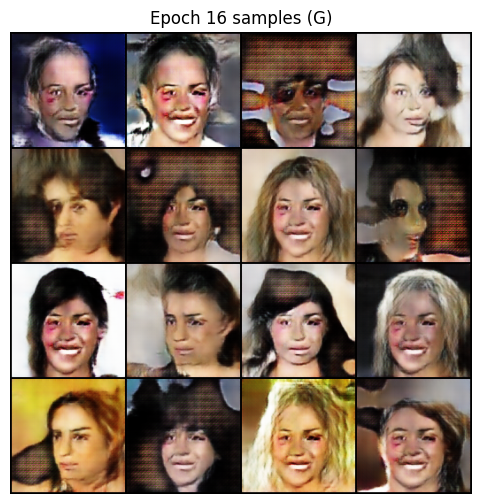

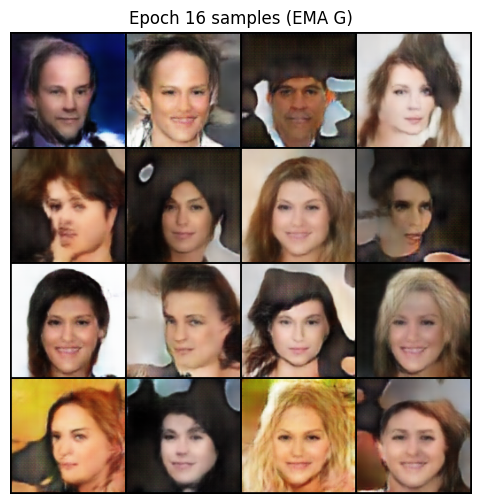

[Epoch 16] Fake channel means: [0.5130995512008667, 0.44134780764579773, 0.3988628387451172], stds: [0.3143913447856903, 0.2993371784687042, 0.29396578669548035]


In [35]:
G_dc, ema_G_dc, D_dc, fixed_noise = train_dcgan(
    G_dc, D_dc, optG_dc, optD_dc, crit_dc,
    dataloader,
    epochs=1, 
    ema_G=ema_G_dc,
    fixed_noise=fixed_noise,
    start_epoch=15
)

In [25]:
ckpt = torch.load(CHECKPOINT_PATH.replace(".pt", "_wgangp_50.pt"), map_location="cuda")

wG.load_state_dict(ckpt["G"])
wD.load_state_dict(ckpt["D"])
wema_G.load_state_dict(ckpt["ema_G"])

woptG.load_state_dict(ckpt["optG"])
woptD.load_state_dict(ckpt["optD"])

start_epoch = ckpt["epoch"]
LATENT_DIM= ckpt["latent_dim"]

print(f"Loaded WGAN-GP checkpoint from epoch {start_epoch}")


Loaded WGAN-GP checkpoint from epoch 50


In [19]:
import os
import torch
from torchvision.utils import save_image
from tqdm import tqdm
import zipfile

# ===== SETTINGS =====
OUTPUT_DIR = "/workspace/generated_10k_wgangp_100"
NUM_SAMPLES = 10000
BATCH = 100 
os.makedirs(OUTPUT_DIR, exist_ok=True)

wema_G.eval()
torch.manual_seed(42)  

print("Generating fake images...")

counter = 0
num_batches = NUM_SAMPLES // BATCH

with torch.no_grad():
    for i in tqdm(range(num_batches)):
        z = torch.randn(BATCH, LATENT_DIM, 1, 1, device=DEVICE)
        fake = wema_G(z).cpu()               
        fake = (fake + 1) / 2                  

        for j in range(BATCH):
            img_path = os.path.join(OUTPUT_DIR, f"{counter:05d}.png")
            save_image(fake[j], img_path)
            counter += 1

print(f"Generated {counter} images in {OUTPUT_DIR}")

ZIP_PATH = "/workspace/generated_10k_wgangp_100.zip"
print("Zipping folder...")

with zipfile.ZipFile(ZIP_PATH, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(OUTPUT_DIR):
        for file in files:
            zipf.write(os.path.join(root, file),
                       arcname=file)

print(f"ZIP saved to {ZIP_PATH}")


Generating fake images...


100%|██████████| 100/100 [00:46<00:00,  2.13it/s]


Generated 10000 images in /workspace/generated_10k_wgangp_100
Zipping folder...
ZIP saved to /workspace/generated_10k_wgangp_100.zip


In [ ]:
wG, wD, woptG, woptD = get_wgangp_models_and_optim()

wG, wema_G, wD, wfixed_noise = train_wgangp(
    wG, wD, woptG, woptD,
    dataloader,
    epochs=100
)
# cleared output for clearence

In [17]:
# here I thought that we were jumping in local minimum because of lr so we are decreaseing it to get more sharpness or detail
for pg in woptG.param_groups:
    pg["lr"] = 5e-5
print("Lowered G LR to 5e-5")

Lowered G LR to 5e-5


[WGAN-GP] Epoch 101/110: 100%|██████████| 792/792 [02:53<00:00,  4.56it/s, d_loss=-0.3044, g_loss=0.0279, D(x)=-0.09, D(G(z))=-0.41]


[WGAN-GP] Epoch 101 | d_loss=-0.3341 | g_loss=0.0279


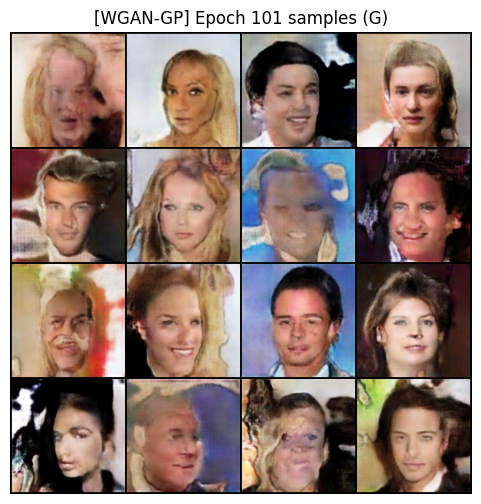

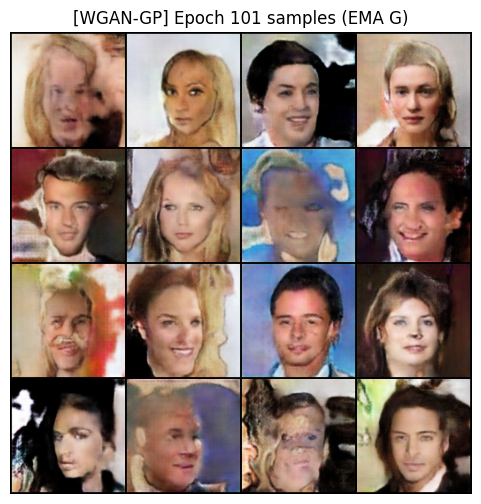

[WGAN-GP] Epoch 102/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3322, g_loss=0.0243, D(x)=0.70, D(G(z))=0.34]  


[WGAN-GP] Epoch 102 | d_loss=-0.3346 | g_loss=0.0243


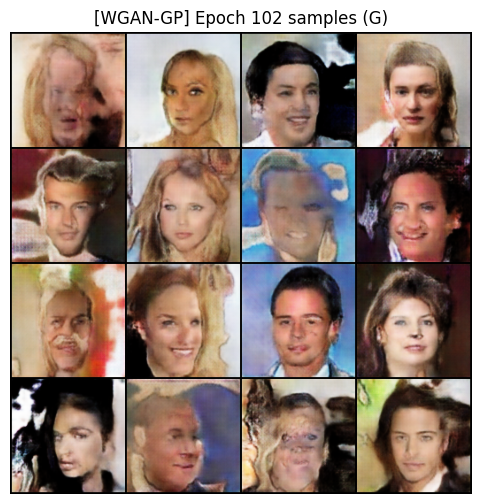

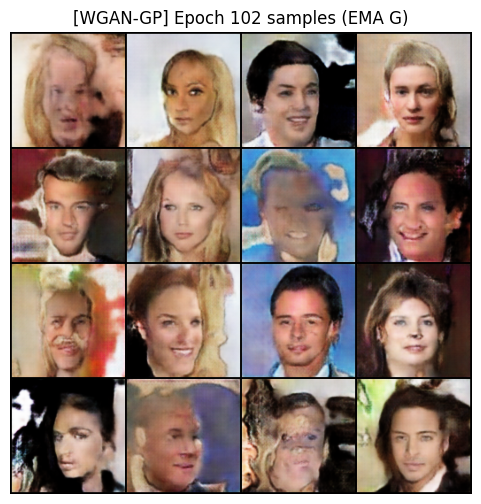

[WGAN-GP] Epoch 103/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3481, g_loss=0.0282, D(x)=0.70, D(G(z))=0.33]  


[WGAN-GP] Epoch 103 | d_loss=-0.3342 | g_loss=0.0282


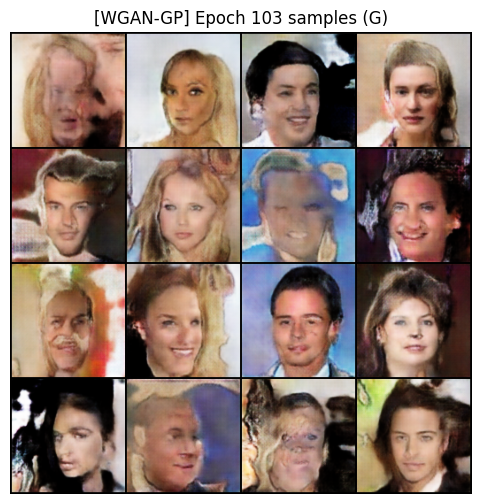

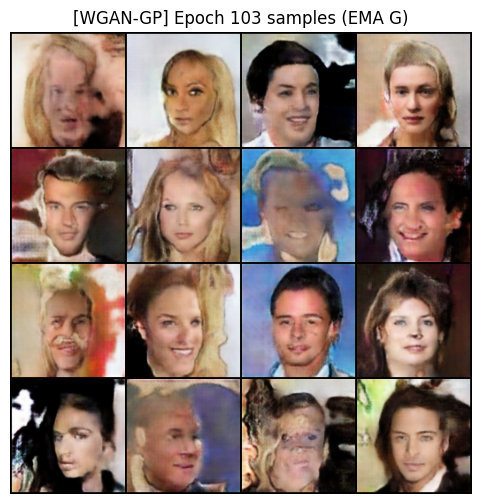

[WGAN-GP] Epoch 104/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3238, g_loss=0.0254, D(x)=0.60, D(G(z))=0.24]   


[WGAN-GP] Epoch 104 | d_loss=-0.3350 | g_loss=0.0254


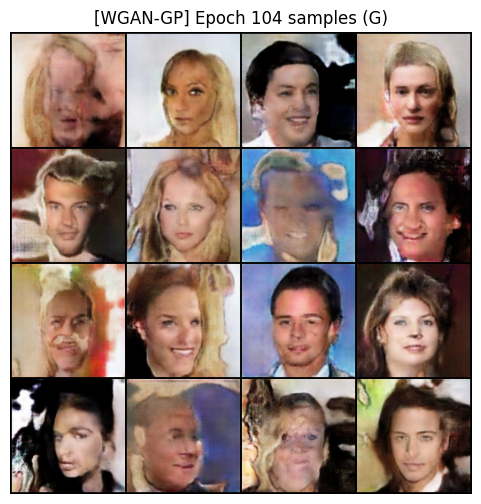

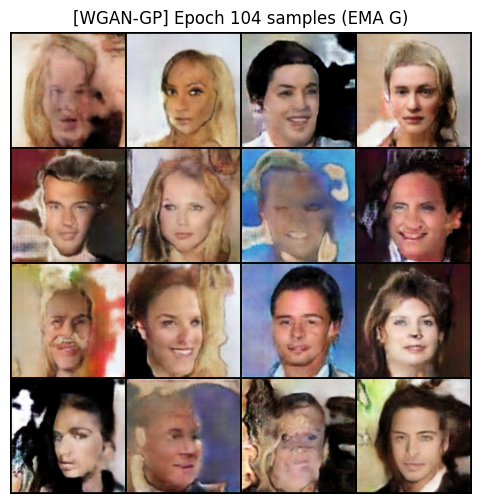

[WGAN-GP] Epoch 105/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3192, g_loss=0.0234, D(x)=0.07, D(G(z))=-0.27] 


[WGAN-GP] Epoch 105 | d_loss=-0.3344 | g_loss=0.0234


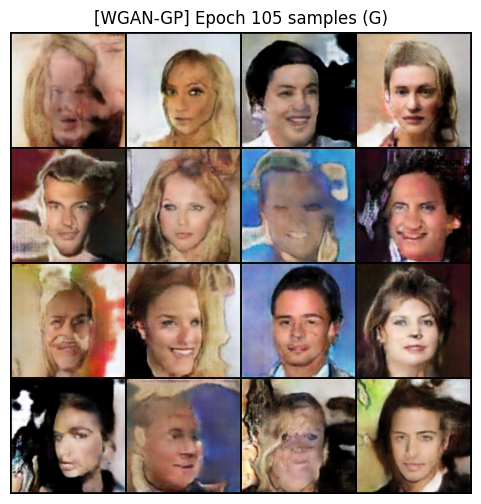

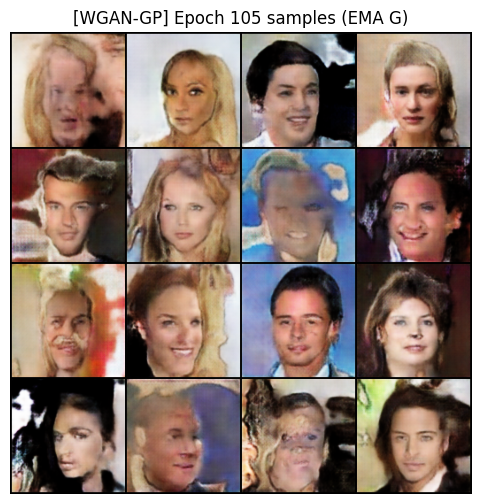

[WGAN-GP] Saved checkpoint at epoch 105


[WGAN-GP] Epoch 106/110: 100%|██████████| 792/792 [02:55<00:00,  4.50it/s, d_loss=-0.2799, g_loss=0.0286, D(x)=0.52, D(G(z))=0.23]  


[WGAN-GP] Epoch 106 | d_loss=-0.3344 | g_loss=0.0286


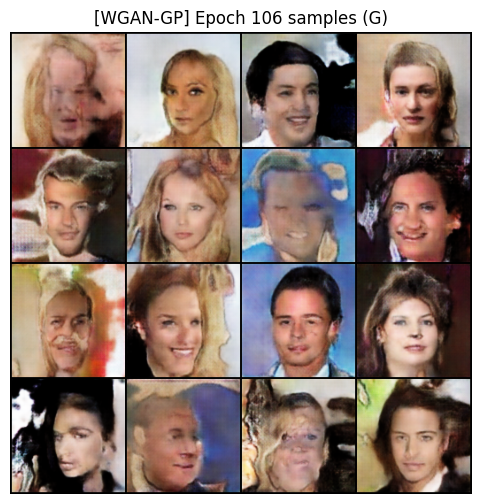

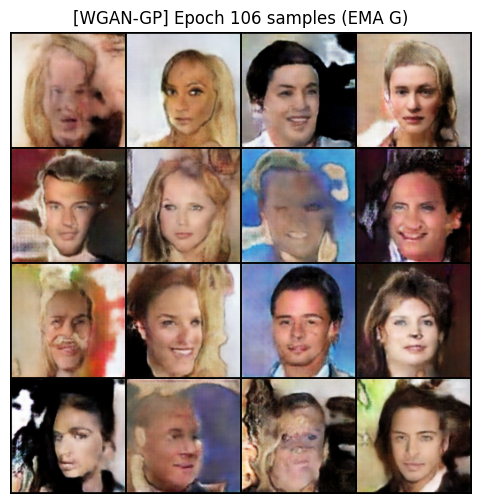

[WGAN-GP] Epoch 107/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3581, g_loss=0.0228, D(x)=0.19, D(G(z))=-0.18] 


[WGAN-GP] Epoch 107 | d_loss=-0.3345 | g_loss=0.0228


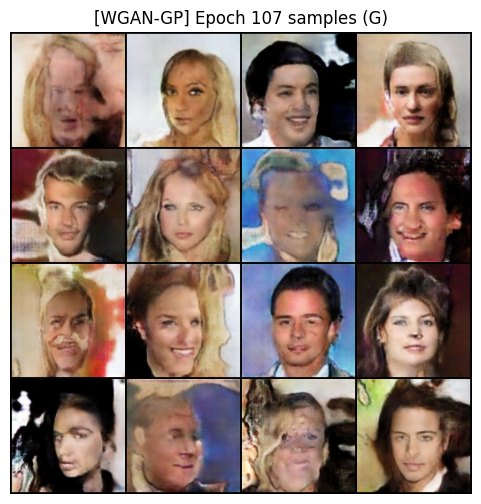

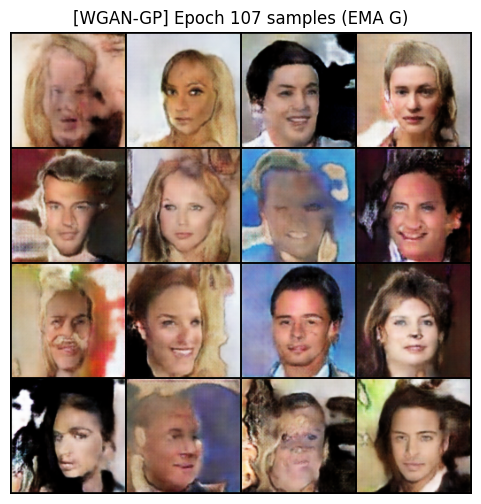

[WGAN-GP] Epoch 108/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3404, g_loss=0.0269, D(x)=0.45, D(G(z))=0.09]  


[WGAN-GP] Epoch 108 | d_loss=-0.3344 | g_loss=0.0269


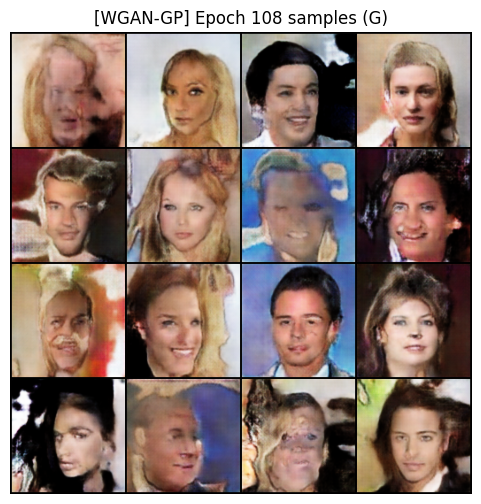

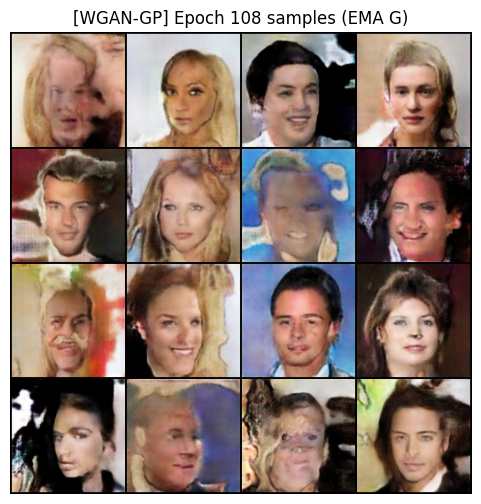

[WGAN-GP] Epoch 109/110: 100%|██████████| 792/792 [02:54<00:00,  4.55it/s, d_loss=-0.3573, g_loss=0.0221, D(x)=0.41, D(G(z))=0.03]  


[WGAN-GP] Epoch 109 | d_loss=-0.3348 | g_loss=0.0221


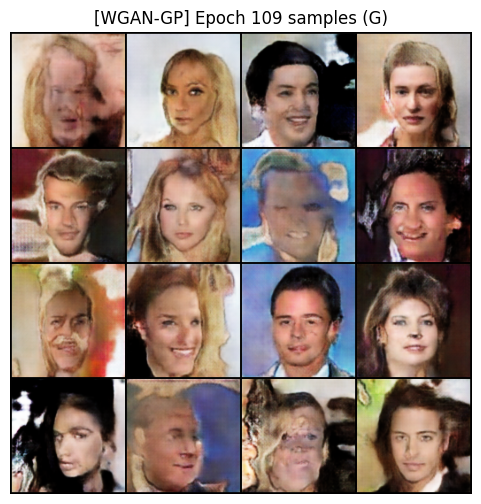

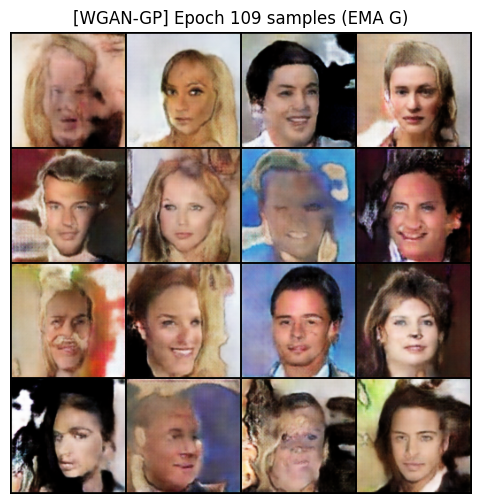

[WGAN-GP] Epoch 110/110: 100%|██████████| 792/792 [02:53<00:00,  4.55it/s, d_loss=-0.3339, g_loss=0.0200, D(x)=0.30, D(G(z))=-0.05] 


[WGAN-GP] Epoch 110 | d_loss=-0.3347 | g_loss=0.0200


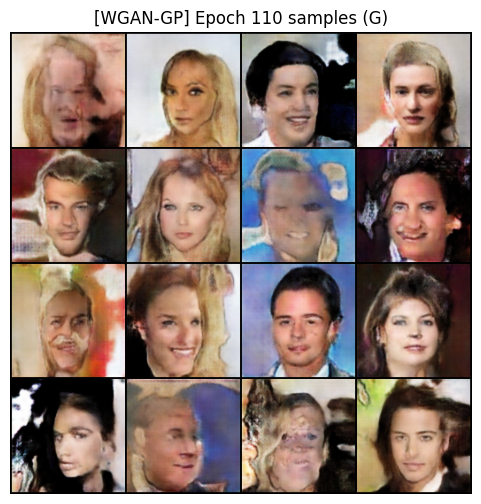

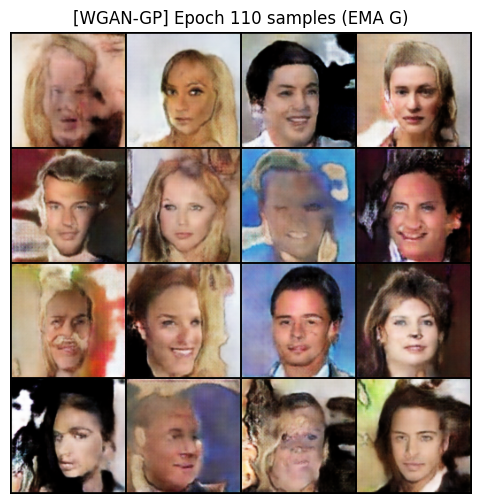

[WGAN-GP] Saved checkpoint at epoch 110


In [18]:
wG, wema_G, wD, wfixed_noise = train_wgangp(
    wG, wD, woptG, woptD,
    dataloader,
    epochs=10, # train 10 more epochs
    ema_G=wema_G,
    fixed_noise=wfixed_noise,
    start_epoch=100  
)

In [ ]:
# no visible changes after 10 epochs, we hit platou